In [1]:
import os

for root, dirs, files in os.walk("/kaggle/input", topdown=True):
    level = root.replace("/kaggle/input", "").count(os.sep)
    indent = "   " * level
    print(f"{indent}{os.path.basename(root)}/")
    subindent = "   " * (level + 1)
    for d in dirs:
        print(f"{subindent}{d}/")
    if level >= 2:
        break


input/
   aerial-threat-raw-dataset/
   aerial-threat-raw-dataset/
      DIAT-uSAT_dataset/
      DIAT-uSAT_dataset/
         Bird+mini-helicopter_1/
         3_long_blade_rotor/
         drone_2/
         Bird+mini-helicopter_2/
         Bird/
         3_short_blade_rotor_1/
         3_short_blade_rotor_2/
         RC plane_1/
         drone_1/
         RC plane_2/


In [2]:

import os, glob, pandas as pd, numpy as np


BASE_PATH = "/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset"


assert os.path.exists(BASE_PATH), f"Dataset not found at: {BASE_PATH}"


IMG_EXTS = (".jpg", ".jpeg", ".png", ".bmp")

class_dirs = sorted([d for d in os.listdir(BASE_PATH) if os.path.isdir(os.path.join(BASE_PATH, d))])
data_summary = []
total_images = 0

for cls in class_dirs:
    cls_path = os.path.join(BASE_PATH, cls)
    files = [f for f in glob.glob(os.path.join(cls_path, "**", "*"), recursive=True)
             if f.lower().endswith(IMG_EXTS)]
    data_summary.append({"Class": cls, "Image Count": len(files)})
    total_images += len(files)

df_summary = pd.DataFrame(data_summary)
df_summary.loc[len(df_summary.index)] = ["TOTAL", total_images]

print(" Dataset Summary:")
display(df_summary)

print(f"\n Dataset successfully located at: {BASE_PATH}")
print(f"Total images found: {total_images}")


 Dataset Summary:


,Class,Image Count
0,3_long_blade_rotor,799
1,3_short_blade_rotor_1,400
2,3_short_blade_rotor_2,400
3,Bird,800
4,Bird+mini-helicopter_1,415
5,Bird+mini-helicopter_2,400
6,RC plane_1,400
7,RC plane_2,400
8,drone_1,400
9,drone_2,435



 Dataset successfully located at: /kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset
Total images found: 4849


In [5]:



import os
import glob

dataset_root = "/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset"


IMG_EXTS = (".jpg", ".jpeg", ".png", ".bmp")

def has_images(path):
    return any(file.lower().endswith(IMG_EXTS) for file in os.listdir(path) if os.path.isfile(os.path.join(path, file)))

detected_folders = []
for root, dirs, files in os.walk(dataset_root):
    for d in dirs:
        folder_path = os.path.join(root, d)
        if has_images(folder_path):
            detected_folders.append(folder_path)

print(f" Found {len(detected_folders)} folders containing images:\n")
for f in detected_folders:
    print(f)



 Found 10 folders containing images:

/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset/Bird+mini-helicopter_1/Bird+2_Blade_rotor_1
/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset/3_long_blade_rotor/3_long_blades_rotor
/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset/drone_2/drone_2
/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset/Bird+mini-helicopter_2/Bird+2_Blade_rotor_2
/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset/Bird/Bird
/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset/3_short_blade_rotor_1/3_short_blade_rotor_1
/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset/3_short_blade_rotor_2/3_short_blade_rotor_2
/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset/RC plane_1/2_blade_rotor_1
/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset/drone_1/drone_1
/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset/RC plane_2/2_blade_rotor_2


In [6]:

import shutil
from tqdm import tqdm

SRC_DIR = "/kaggle/input/aerial-threat-raw-dataset/DIAT-uSAT_dataset"
MERGED_DIR = "/kaggle/working/merged_dataset"
os.makedirs(MERGED_DIR, exist_ok=True)

MERGE_MAP = {
    "3_long_blade_rotor": ["3_long_blade_rotor/3_long_blades_rotor"],
    "3_short_blade_rotor": [
        "3_short_blade_rotor_1/3_short_blade_rotor_1",
        "3_short_blade_rotor_2/3_short_blade_rotor_2"
    ],
    "Bird": ["Bird/Bird"],
    "Bird+mini-helicopter": [
        "Bird+mini-helicopter_1/Bird+2_Blade_rotor_1",
        "Bird+mini-helicopter_2/Bird+2_Blade_rotor_2"
    ],
    "RC_plane": [
        "RC plane_1/2_blade_rotor_1",
        "RC plane_2/2_blade_rotor_2"
    ],
    "drone": [
        "drone_1/drone_1",
        "drone_2/drone_2"
    ]
}

IMG_EXTS = (".jpg", ".jpeg", ".png", ".bmp")

print(f"\nCreating merged dataset at: {MERGED_DIR}\n")

for merged_name, subdirs in tqdm(MERGE_MAP.items(), desc="Merging Classes"):
    merged_class_dir = os.path.join(MERGED_DIR, merged_name)
    os.makedirs(merged_class_dir, exist_ok=True)
    count = 0

    for sub in subdirs:
        sub_dir = os.path.join(SRC_DIR, sub)
        if not os.path.exists(sub_dir):
            print(f" Missing: {sub_dir}")
            continue
        for file in glob.glob(os.path.join(sub_dir, "*")):
            if file.lower().endswith(IMG_EXTS):
                shutil.copy(file, os.path.join(merged_class_dir, os.path.basename(file)))
                count += 1
    print(f" {merged_name}: {count} images merged")

print("\n Merging complete. Checking structure...\n")

merged_summary = []
total_merged = 0
for cls in sorted(os.listdir(MERGED_DIR)):
    cls_path = os.path.join(MERGED_DIR, cls)
    count = len([f for f in glob.glob(os.path.join(cls_path, "*")) if f.lower().endswith(IMG_EXTS)])
    merged_summary.append({"Merged_Class": cls, "Total_Images": count})
    total_merged += count

df_merged = pd.DataFrame(merged_summary)
df_merged.loc[len(df_merged.index)] = ["TOTAL", total_merged]
display(df_merged)

print(f" Final merged dataset ready at: {MERGED_DIR}")



Creating merged dataset at: /kaggle/working/merged_dataset



Merging Classes:  17%|█▋        | 1/6 [00:09<00:48,  9.69s/it]

 3_long_blade_rotor: 799 images merged


Merging Classes:  33%|███▎      | 2/6 [00:17<00:34,  8.53s/it]

 3_short_blade_rotor: 800 images merged


Merging Classes:  50%|█████     | 3/6 [00:22<00:20,  6.92s/it]

 Bird: 800 images merged


Merging Classes:  67%|██████▋   | 4/6 [00:36<00:19,  9.64s/it]

 Bird+mini-helicopter: 815 images merged


Merging Classes:  83%|████████▎ | 5/6 [00:57<00:13, 13.66s/it]

 RC_plane: 800 images merged


Merging Classes: 100%|██████████| 6/6 [01:14<00:00, 12.49s/it]

 drone: 835 images merged

 Merging complete. Checking structure...



,Merged_Class,Total_Images
0,3_long_blade_rotor,799
1,3_short_blade_rotor,800
2,Bird,800
3,Bird+mini-helicopter,815
4,RC_plane,800
5,drone,835
6,TOTAL,4849


 Final merged dataset ready at: /kaggle/working/merged_dataset


Found 4849 files belonging to 6 classes.


I0000 00:00:1762423722.090067      37 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


 Classes (6): ['3_long_blade_rotor', '3_short_blade_rotor', 'Bird', 'Bird+mini-helicopter', 'RC_plane', 'drone']


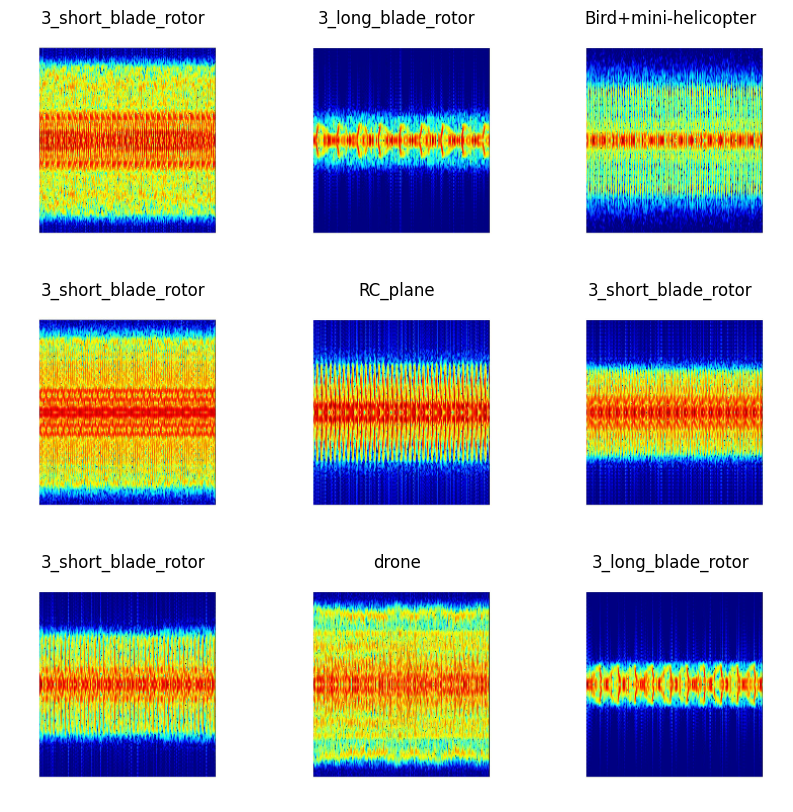

In [7]:

import tensorflow as tf
import matplotlib.pyplot as plt

DATA_DIR = "/kaggle/working/merged_dataset"
IMG_SIZE = (224, 224)
BATCH_SIZE = 32


dataset = tf.keras.utils.image_dataset_from_directory(
    DATA_DIR,
    label_mode="int",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42
)
class_names = dataset.class_names  


def normalize_img(img, label):
    img = tf.cast(img, tf.float32) / 127.5 - 1.0
    return img, label

dataset = dataset.map(normalize_img, num_parallel_calls=tf.data.AUTOTUNE)
dataset = dataset.prefetch(tf.data.AUTOTUNE)


print(f" Classes ({len(class_names)}): {class_names}")


plt.figure(figsize=(10, 10))
for images, labels in dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow((images[i] + 1) / 2)
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()







In [9]:


from tensorflow.keras import layers, Model, Input
import tensorflow as tf

latent_dim = 128
num_classes = len(class_names)

# Spectral Normalization
class SpectralNormalization(layers.Wrapper):
    def __init__(self, layer, power_iterations=1, **kwargs):
        super(SpectralNormalization, self).__init__(layer, **kwargs)
        self.power_iterations = power_iterations

    def build(self, input_shape):
        self.layer.build(input_shape)
        self.w = self.layer.kernel
        self.u = self.add_weight(shape=(1, self.w.shape[-1]),
                                 initializer=tf.random_normal_initializer(),
                                 trainable=False,
                                 name='sn_u')

    def call(self, inputs, training=None):
        w_shape = self.w.shape.as_list()
        w_reshaped = tf.reshape(self.w, [-1, w_shape[-1]])
        u_hat = self.u
        v_hat = tf.linalg.l2_normalize(tf.matmul(u_hat, tf.transpose(w_reshaped)))
        for _ in range(self.power_iterations):
            u_hat = tf.linalg.l2_normalize(tf.matmul(v_hat, w_reshaped))
            v_hat = tf.linalg.l2_normalize(tf.matmul(u_hat, tf.transpose(w_reshaped)))
        sigma = tf.matmul(tf.matmul(v_hat, w_reshaped), tf.transpose(u_hat))
        self.layer.kernel.assign(self.w / sigma)
        self.u.assign(u_hat)
        return self.layer(inputs, training=training)

# Residual Block 
def residual_block(x, filters):
    skip = x
    x = layers.Conv2DTranspose(filters, kernel_size=3, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    x = layers.Conv2DTranspose(filters, kernel_size=3, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Add()([x, skip])
    x = layers.LeakyReLU()(x)
    return x

#  Generator 
def build_generator():
    noise_input = Input(shape=(latent_dim,), name="noise_input")
    class_label = Input(shape=(1,), dtype="int32", name="class_label")

    embedding = layers.Embedding(num_classes, latent_dim)(class_label)
    embedding = layers.Flatten()(embedding)
    model_input = layers.Multiply()([noise_input, embedding])

    x = layers.Dense(14 * 14 * 512)(model_input)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    x = layers.Reshape((14, 14, 512))(x)

    x = layers.Conv2DTranspose(256, 4, strides=2, padding="same")(x)
    x = residual_block(x, 256)

    x = layers.Conv2DTranspose(128, 4, strides=2, padding="same")(x)
    x = residual_block(x, 128)

    x = layers.Conv2DTranspose(64, 4, strides=2, padding="same")(x)
    x = residual_block(x, 64)

    x = layers.Conv2DTranspose(32, 4, strides=2, padding="same")(x)
    x = residual_block(x, 32)

    output = layers.Conv2D(3, 5, activation="tanh", padding="same")(x)
    return Model([noise_input, class_label], output, name="Generator")

#  Discriminator
def build_discriminator():
    image = layers.Input(shape=(224, 224, 3))
    label = layers.Input(shape=(1,), dtype="int32")

    label_embedding = layers.Embedding(num_classes, 224 * 224)(label)
    label_embedding = layers.Reshape((224, 224, 1))(label_embedding)
    conditioned_image = layers.Concatenate()([image, label_embedding])

    x = SpectralNormalization(layers.Conv2D(64, 5, strides=2, padding="same"))(conditioned_image)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Dropout(0.3)(x)

    x = SpectralNormalization(layers.Conv2D(128, 5, strides=2, padding="same"))(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Dropout(0.3)(x)

    x = SpectralNormalization(layers.Conv2D(256, 5, strides=2, padding="same"))(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Flatten()(x)
    x = layers.Dense(1, activation="sigmoid")(x)
    return Model([image, label], x, name="Discriminator")

# --- Build and Summarize Models ---
generator = build_generator()
discriminator = build_discriminator()

generator.summary()
discriminator.summary()

print("\n Improved Conditional GAN models built successfully (no external addons).")



Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ class_label         │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_2         │ (None, 1, 128)    │        768 │ class_label[0][0] │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ noise_input         │ (None, 128)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_2 (Flatten) │ (None, 128)       │          0 │ embedding_2[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply_1          │ (None, 128)       │          0 │ noise_input[0][0… │
│ (Multiply)          │                   │            │ flatten_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 100352)    │ 12,945,408 │ multiply_1[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 100352)    │    401,408 │ dense_2[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_12      │ (None, 100352)    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_2 (Reshape) │ (None, 14, 14,    │          0 │ leaky_re_lu_12[0… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_12 │ (None, 28, 28,    │  2,097,408 │ reshape_2[0][0]   │
│ (Conv2DTranspose)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_13 │ (None, 28, 28,    │    590,080 │ conv2d_transpose… │
│ (Conv2DTranspose)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 28, 28,    │      1,024 │ conv2d_transpose… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_13      │ (None, 28, 28,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_14 │ (None, 28, 28,    │    590,080 │ leaky_re_lu_13[0… │
│ (Conv2DTranspose)   │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 28, 28,    │      1,024 │ conv2d_transpose… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_4 (Add)         │ (None, 28, 28,    │          0 │ batch_normalizat… │
│                     │ 256)              │            │ conv2d_transpose… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_14      │ (None, 28, 28,    │          0 │ add_4[0][0]       │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 17,707,267 (67.55 MB)

 Trainable params: 17,504,643 (66.77 MB)

 Non-trainable params: 202,624 (791.50 KB)

Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_3         │ (None, 1, 50176)  │    301,056 │ input_layer_3[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_3 (Reshape) │ (None, 224, 224,  │          0 │ embedding_3[0][0] │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 224, 224,  │          0 │ input_layer_2[0]… │
│ (Concatenate)       │ 4)                │            │ reshape_3[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spectral_normaliza… │ (None, 112, 112,  │      6,528 │ concatenate_1[0]… │
│ (SpectralNormaliza… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_21      │ (None, 112, 112,  │          0 │ spectral_normali… │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 112, 112,  │          0 │ leaky_re_lu_21[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spectral_normaliza… │ (None, 56, 56,    │    205,056 │ dropout_3[0][0]   │
│ (SpectralNormaliza… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_22      │ (None, 56, 56,    │          0 │ spectral_normali… │
│ (LeakyReLU)         │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 56, 56,    │          0 │ leaky_re_lu_22[0… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spectral_normaliza… │ (None, 28, 28,    │    819,712 │ dropout_4[0][0]   │
│ (SpectralNormaliza… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_23      │ (None, 28, 28,    │          0 │ spectral_normali… │
│ (LeakyReLU)         │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 28, 28,    │          0 │ leaky_re_lu_23[0… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_3 (Flatten) │ (None, 200704)    │          0 │ dropout_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 1)         │    200,705 │ flatten_3[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 1,533,057 (5.85 MB)

 Trainable params: 1,532,609 (5.85 MB)

 Non-trainable params: 448 (1.75 KB)


 Improved Conditional GAN models built successfully (no external addons).


In [10]:


import tensorflow as tf
import matplotlib.pyplot as plt
import os
import time


EPOCHS = 200
LATENT_DIM = 128
OUTPUT_DIR = "/kaggle/working/generated_samples_improved"
os.makedirs(OUTPUT_DIR, exist_ok=True)


gen_optimizer  = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
disc_optimizer = tf.keras.optimizers.Adam(4e-5, beta_1=0.5)


bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return bce(tf.ones_like(fake_output) * 0.9, fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = bce(tf.ones_like(real_output) * 0.9, real_output)
    fake_loss = bce(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss


def augment_images(img, label):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_brightness(img, 0.05)
    img = tf.image.random_contrast(img, 0.95, 1.05)
    return img, label

augmented_ds = dataset.map(augment_images, num_parallel_calls=tf.data.AUTOTUNE)
augmented_ds = augmented_ds.prefetch(tf.data.AUTOTUNE)


@tf.function
def train_step(images, labels):
    noise = tf.random.normal([tf.shape(images)[0], LATENT_DIM])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator([noise, labels], training=True)
        real_output = discriminator([images, labels], training=True)
        fake_output = discriminator([generated_images, labels], training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    grads_gen  = gen_tape.gradient(gen_loss, generator.trainable_variables)
    grads_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    gen_optimizer.apply_gradients(zip(grads_gen, generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(grads_disc, discriminator.trainable_variables))

    return gen_loss, disc_loss


def save_sample_images(generator, epoch, latent_dim=LATENT_DIM, num_classes=len(class_names)):
    noise = tf.random.normal([num_classes, latent_dim])
    labels = tf.range(0, num_classes)
    generated = generator([noise, labels], training=False)
    generated = (generated + 1) / 2.0

    fig, axes = plt.subplots(1, num_classes, figsize=(15, 3))
    for i in range(num_classes):
        axes[i].imshow(generated[i])
        axes[i].set_title(class_names[i])
        axes[i].axis("off")
    plt.tight_layout()
    fig.savefig(f"{OUTPUT_DIR}/epoch_{epoch:03d}.png")
    plt.close(fig)


for epoch in range(1, EPOCHS + 1):
    start_time = time.time()
    gen_loss_total, disc_loss_total, steps = 0.0, 0.0, 0

    for images, labels in augmented_ds:
        g_loss, d_loss = train_step(images, labels)
        gen_loss_total += g_loss.numpy()
        disc_loss_total += d_loss.numpy()
        steps += 1

    avg_gen_loss = gen_loss_total / steps
    avg_disc_loss = disc_loss_total / steps
    print(f"Epoch {epoch:03d}/{EPOCHS} | Gen Loss: {avg_gen_loss:.4f} | Disc Loss: {avg_disc_loss:.4f} | Time: {time.time()-start_time:.1f}s")

    # Save every 10 epochs (or first one)
    if epoch % 10 == 0 or epoch == 1:
        save_sample_images(generator, epoch)

print("\n Training complete! Check generated images in:", OUTPUT_DIR)


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py:780: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
E0000 00:00:1762423781.756707      37 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inDiscriminator_1/dropout_3_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1762423783.756553     107 cuda_dnn.cc:529] Loaded cuDNN version 90300
E0000 00:00:1762423854.112702      37 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inDiscriminator_1/dropout_3_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Epoch 001/200 | Gen Loss: 0.9331 | Disc Loss: 1.2585 | Time: 87.8s
Epoch 002/200 | Gen Loss: 0.7465 | Disc Loss: 1.4899 | Time: 61.0s
Epoch 003/200 | Gen Loss: 0.7327 | Disc Loss: 1.5011 | Time: 60.8s
Epoch 004/200 | Gen Loss: 0.7347 | Disc Loss: 1.4734 | Time: 60.8s
Epoch 005/200 | Gen Loss: 0.7754 | Disc Loss: 1.4035 | Time: 60.9s
Epoch 006/200 | Gen Loss: 0.7682 | Disc Loss: 1.4139 | Time: 60.9s
Epoch 007/200 | Gen Loss: 0.7799 | Disc Loss: 1.3929 | Time: 60.6s
Epoch 008/200 | Gen Loss: 0.7740 | Disc Loss: 1.3998 | Time: 60.7s
Epoch 009/200 | Gen Loss: 0.7753 | Disc Loss: 1.3964 | Time: 60.9s
Epoch 010/200 | Gen Loss: 0.7769 | Disc Loss: 1.3947 | Time: 60.7s
Epoch 011/200 | Gen Loss: 0.7767 | Disc Loss: 1.3899 | Time: 60.9s
Epoch 012/200 | Gen Loss: 0.7967 | Disc Loss: 1.3761 | Time: 60.8s
Epoch 013/200 | Gen Loss: 0.7901 | Disc Loss: 1.3809 | Time: 60.9s
Epoch 014/200 | Gen Loss: 0.8033 | Disc Loss: 1.3686 | Time: 60.7s
Epoch 015/200 | Gen Loss: 0.8065 | Disc Loss: 1.3641 | Time: 6

In [21]:


import tensorflow as tf
import numpy as np
import os, glob, shutil, zipfile
from tqdm import tqdm
from PIL import Image

# --- Directories ---
SOURCE_DIR = "/kaggle/working/merged_dataset"
OUTPUT_DIR = "/kaggle/working/GANgen_dataset_"
os.makedirs(OUTPUT_DIR, exist_ok=True)

TARGET_COUNT = 2000  # desired images per class
LATENT_DIM = 128

print(" Expanding dataset using trained GAN generator...")
print(f"Source: {SOURCE_DIR}")
print(f"Output: {OUTPUT_DIR}\n")

IMG_EXTS = (".jpg", ".jpeg", ".png", ".bmp")


def save_generated_image(image_tensor, save_path):
    img = tf.cast((image_tensor + 1) * 127.5, tf.uint8).numpy()
    img = Image.fromarray(img)
    img.save(save_path, format="PNG")

# --- Iterate over classes ---
for class_idx, class_name in enumerate(sorted(os.listdir(SOURCE_DIR))):
    src_class_dir = os.path.join(SOURCE_DIR, class_name)
    if not os.path.isdir(src_class_dir):
        continue

    out_class_dir = os.path.join(OUTPUT_DIR, class_name)
    os.makedirs(out_class_dir, exist_ok=True)

    existing_images = glob.glob(os.path.join(src_class_dir, "*"))
    count_existing = len([f for f in existing_images if f.lower().endswith(IMG_EXTS)])
    print(f" {class_name}: {count_existing} existing images")

    # Copy existing images first
    for file in existing_images:
        if file.lower().endswith(IMG_EXTS):
            shutil.copy(file, os.path.join(out_class_dir, os.path.basename(file)))

    # Generate more if needed
    if count_existing < TARGET_COUNT:
        needed = TARGET_COUNT - count_existing
        print(f"    Generating {needed} new images using GAN...")
        batches = needed // 32 + 1
        generated_count = 0

        for _ in tqdm(range(batches), desc=f"Generating for {class_name}"):
            noise = tf.random.normal([32, LATENT_DIM])
            labels = tf.fill([32], class_idx)
            gen_imgs = generator([noise, labels], training=False)

            for img in gen_imgs:
                if generated_count >= needed:
                    break
                save_path = os.path.join(out_class_dir, f"gen_{generated_count:04d}.png")
                save_generated_image(img, save_path)
                generated_count += 1

        print(f"    Generated {generated_count} synthetic images.")

    else:
        print("    Already has enough images.")

print("\n Creating ZIP file...")
zip_path = "/kaggle/working/expanded_dataset_2000.zip"
with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zipf:
    for root, _, files in os.walk(OUTPUT_DIR):
        for file in files:
            file_path = os.path.join(root, file)
            zipf.write(file_path, os.path.relpath(file_path, OUTPUT_DIR))

print(f"\n Dataset expanded and zipped successfully!")
print(f" Final ZIP ready for download at: {zip_path}")
print(" Go to 'Output → Files' in Kaggle to download it.")


 Expanding dataset using trained GAN generator...
Source: /kaggle/working/merged_dataset
Output: /kaggle/working/GANgen_dataset_

 3_long_blade_rotor: 799 existing images
    Generating 1201 new images using GAN...


Generating for 3_long_blade_rotor: 100%|██████████| 38/38 [00:20<00:00,  1.89it/s]


    Generated 1201 synthetic images.
 3_short_blade_rotor: 800 existing images
    Generating 1200 new images using GAN...


Generating for 3_short_blade_rotor: 100%|██████████| 38/38 [00:19<00:00,  1.93it/s]


    Generated 1200 synthetic images.
 Bird: 800 existing images
    Generating 1200 new images using GAN...


Generating for Bird: 100%|██████████| 38/38 [00:18<00:00,  2.01it/s]


    Generated 1200 synthetic images.
 Bird+mini-helicopter: 815 existing images
    Generating 1185 new images using GAN...


Generating for Bird+mini-helicopter: 100%|██████████| 38/38 [00:18<00:00,  2.05it/s]


    Generated 1185 synthetic images.
 RC_plane: 800 existing images
    Generating 1200 new images using GAN...


Generating for RC_plane: 100%|██████████| 38/38 [00:18<00:00,  2.05it/s]


    Generated 1200 synthetic images.
 drone: 835 existing images
    Generating 1165 new images using GAN...


Generating for drone: 100%|██████████| 37/37 [00:14<00:00,  2.47it/s]


    Generated 1165 synthetic images.

 Creating ZIP file...

 Dataset expanded and zipped successfully!
 Final ZIP ready for download at: /kaggle/working/expanded_dataset_2000.zip
 Go to 'Output → Files' in Kaggle to download it.


 Found 6 classes:
['3_long_blade_rotor', '3_short_blade_rotor', 'Bird', 'Bird+mini-helicopter', 'RC_plane', 'drone'] 



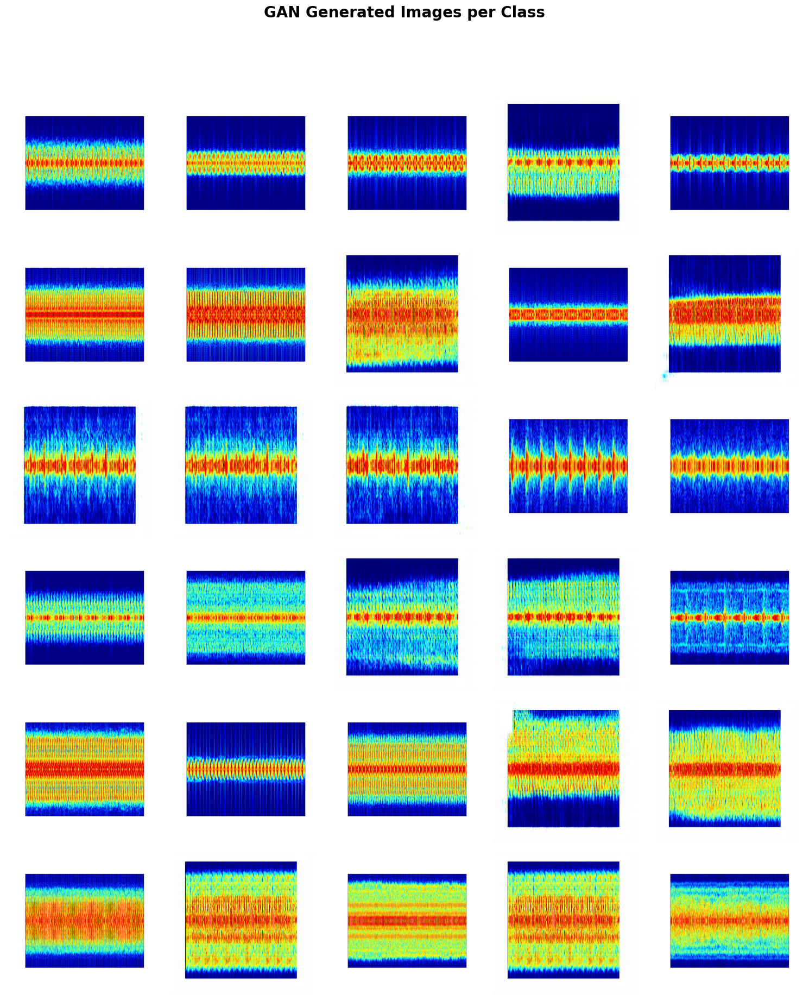

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image


DATASET_DIR = "/kaggle/working/expanded_dataset_2000"


class_names = sorted([d for d in os.listdir(DATASET_DIR) if os.path.isdir(os.path.join(DATASET_DIR, d))])

print(f" Found {len(class_names)} classes:")
print(class_names, "\n")


fig, axes = plt.subplots(len(class_names), 5, figsize=(15, 3 * len(class_names)))


fig.suptitle("GAN Generated Images per Class", fontsize=20, fontweight="bold", y=1.02)

for i, class_name in enumerate(class_names):
    class_dir = os.path.join(DATASET_DIR, class_name)
    all_images = [os.path.join(class_dir, f) for f in os.listdir(class_dir) if f.lower().endswith((".png", ".jpg", ".jpeg"))]
    
   
    sample_imgs = random.sample(all_images, min(5, len(all_images)))

    for j, img_path in enumerate(sample_imgs):
        img = Image.open(img_path).convert("RGB")
        axes[i, j].imshow(img)
        axes[i, j].axis("off")
        if j == 0:
            axes[i, j].set_ylabel(class_name, fontsize=12, rotation=0, labelpad=45, weight="bold", va="center")

plt.tight_layout()
plt.subplots_adjust(top=0.93)
plt.show()


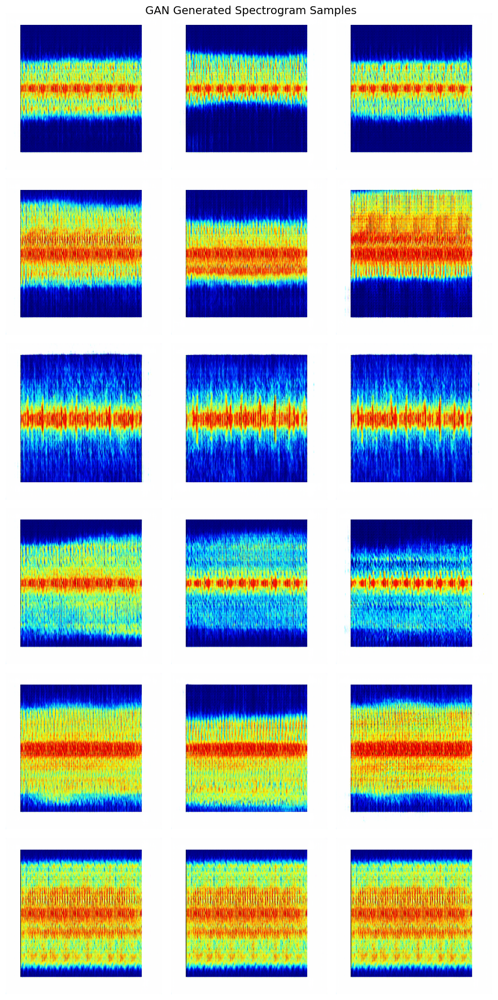

In [52]:


import tensorflow as tf
import matplotlib.pyplot as plt


LATENT_DIM = 128
num_classes = len(class_names)
samples_per_class = 3 


rows = num_classes
cols = samples_per_class
plt.figure(figsize=(cols * 3, rows * 3))

for class_idx in range(num_classes):
    
    labels = tf.constant([class_idx] * samples_per_class)
    noise = tf.random.normal([samples_per_class, LATENT_DIM])
    generated = generator([noise, labels], training=False)
    generated = (generated + 1) / 2.0  

    for j in range(samples_per_class):
        plt.subplot(rows, cols, class_idx * cols + j + 1)
        plt.imshow(generated[j])
        if j == 0:
            plt.ylabel(class_names[class_idx], fontsize=10)
        plt.axis("off")

plt.suptitle(" GAN Generated Spectrogram Samples", fontsize=14)
plt.tight_layout()
plt.show()


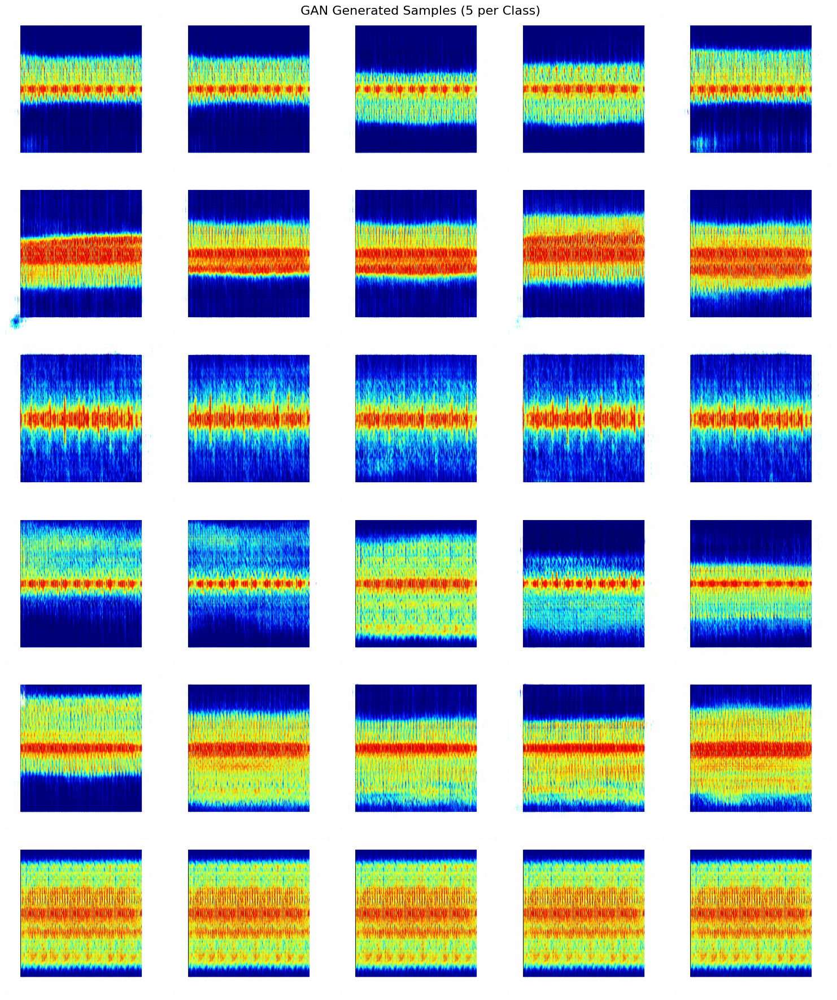

In [38]:
# =============================
# CELL 7: Show 5 Generated Samples for Each Class
# =============================

import tensorflow as tf
import matplotlib.pyplot as plt

# --- Configuration ---
LATENT_DIM = 128
num_classes = len(class_names)
samples_per_class = 5  # number of images to show per class

# --- Generate Samples ---
rows, cols = num_classes, samples_per_class
plt.figure(figsize=(cols * 3, rows * 3))

for class_idx in range(num_classes):
    # Prepare noise & labels for this class
    labels = tf.constant([class_idx] * samples_per_class)
    noise = tf.random.normal([samples_per_class, LATENT_DIM])
    
    # Generate and rescale images
    generated = generator([noise, labels], training=False)
    generated = (generated + 1) / 2.0  # rescale to [0, 1]

    for j in range(samples_per_class):
        plt.subplot(rows, cols, class_idx * cols + j + 1)
        plt.imshow(generated[j])
        if j == 0:
            plt.ylabel(class_names[class_idx], fontsize=10)
        plt.axis("off")

plt.suptitle(" GAN Generated Samples (5 per Class)", fontsize=16)
plt.tight_layout()
plt.show()
